Данный скрипт позволяет сгладить данные путём взятие взвешенного среднего арифметического от соседних элементов, а также отобразить координаты маркеров для сглаженных и несглаженных данных

In [ ]:
import numpy as np
import pandas as pd
from io import StringIO
import matplotlib.pyplot as plt
from numpy import linalg as LA

In [2]:
#Все маркеры
markers = ['RAH', 'RPH', 'LAH', 'LPH', 'C7', 'T8', 'IJ', 'PX','RSC', 'RAC','LSC', 'LAC', 'RAI', 'RPC',
           'RTS', 'RAA', 'LAI', 'LTS', 'LAA', 'LPC', 'REM', 'REL', 'LEM', 'LEL', 'RRS', 'RUS', 'LRS', 'LUS', 'LSJ', 'RSJ']
#Хранит названия колонок в списке
cols = []
#Условно неподвижные маркеры 
stablecols = []
#Хранит названия колонок в строке
csvcols = ''
for i in markers:
    cols.append(i + 'x')
    cols.append(i + 'y')
    cols.append(i + 'z')
    csvcols += cols[-3] + '\t' + cols[-2] + '\t' + cols[-1] + '\t'

In [52]:
files = ['1.trc', '2.trc','3.trc','4.trc','5.trc','6.trc','7.trc','8.trc','9.trc','9_combined.trc','9_left.trc','9_right.trc',
'10.trc', '11.trc','12.trc','12_shrugging.trc','13.trc','14.trc','14_depression.trc', '14_elevation.trc', 'very long static 14.trc']
#Файлы, подлежащие обработке
files = ['7.trc']
#Если надо указать какой-то префикс, общий для путей ко всем файлам, то это можно сделать здесь
for i in range(len(files)):
    #files[i] = 'shifted_trc\\' + files[i][0:-4] + '_shifted.trc'
    files[i] = 'raw_trc_data\\' + files[i]
for file in files:
    #Data from original file
    datalines = []
    with open (file, 'r') as fp:
        datalines = fp.readlines()
        infolines = datalines[0:5]
        datalines = datalines[5:-1]
    textdatalines = ''
    textinfodatalines = ''
    for i in datalines:
        textdatalines += i + '\n'
    #df хранит данные оригинального файла. портить нельзя
    df = pd.read_csv(StringIO(textdatalines), sep = '\t', names = ['Frame#', 'Time'] + cols)
    #версия сглаживания на предвдущем шаге
    df1 = df.copy()
    #версия сглаживания на текущем шаге
    df2 = df1.copy()
    for i in range(15):
        for j in cols:
            df2[j].values[1] = (df1[j].values[0] + df1[j].values[2]) / 2
            df2[j].values[2] = (df1[j].values[3] + df1[j].values[1] + df1[j].values[2]) / 3
            for k in range(3, df.shape[0]-3):
                #df2[j].values[k] = (0.125 * df1[j].values[k-2] + 0.25 * df1[j].values[k-1] + 0.25 * 
                                    #df1[j].values[k] + 0.25 * df1[j].values[k+1] + 0.125 * df1[j].values[k+2])
                #Здесь происходит сглаживание
                df2[j].values[k] = (0.05 * df1[j].values[k-3] + 0.1 * df1[j].values[k-2] + 0.23 * df1[j].values[k-1] +
                                 0.24 * df1[j].values[k] + 0.23 * df1[j].values[k+1] + 0.1 * df1[j].values[k+2] + 
                                 0.05 * df1[j].values[k+3])
            df2[j].values[-3] = (df1[j].values[-4] + df1[j].values[-3] + df1[j].values[-2]) / 3
            df2[j].values[-2] = (df1[j].values[-3] + df1[j].values[-1]) / 2
        df1 = df2.copy()               
    
    #Запись в файл
    newinfolines = infolines
    newinfolines[0] = "PathFileType\t4\t(X/Y/Z)\\" + file[0:-4] + '_smoothed.trc\n'
    newinfolines[2] = '100\t100\t' + str(len(df2)+1) + '\t30\tmm\t100\t' + str(df2['Time'].values[0]) + '\t' + str(len(df2)+1) + '\n'
    
    newtextlines = df2.to_csv(sep = '\t', header=False, index = False)
    newtextlines = ''.join(newinfolines) + newtextlines
    with open (file[0:-4] + '_smoothed.trc', 'w+') as fp:
        fp.write(newtextlines)

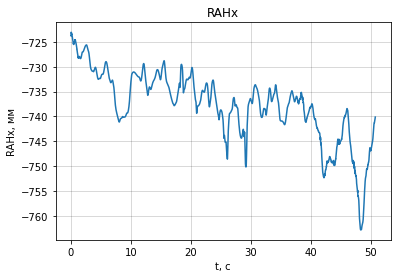

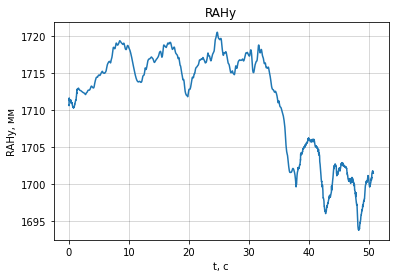

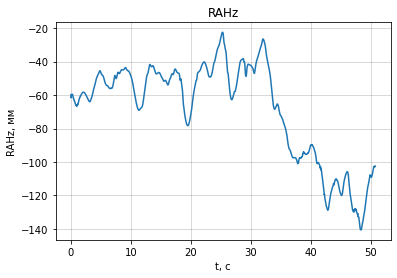

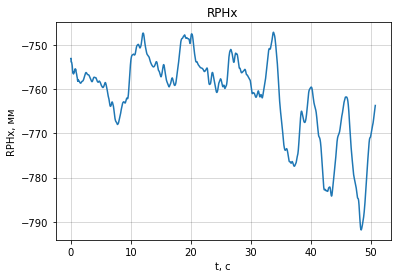

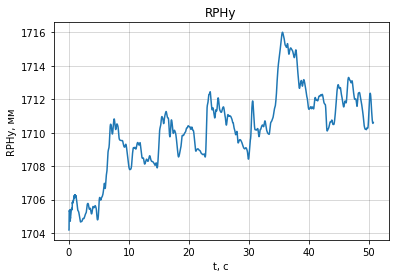

...

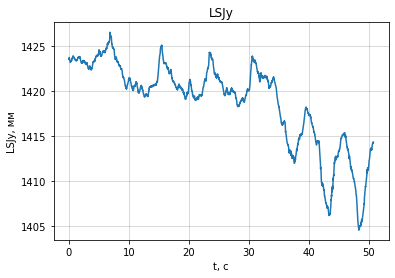

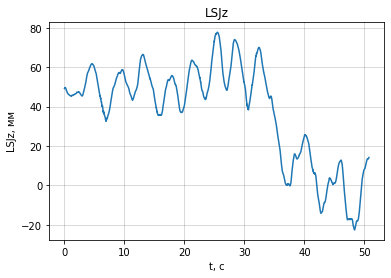

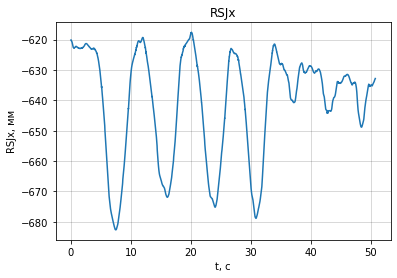

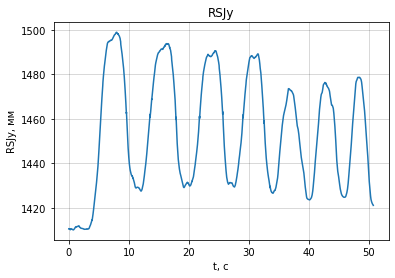

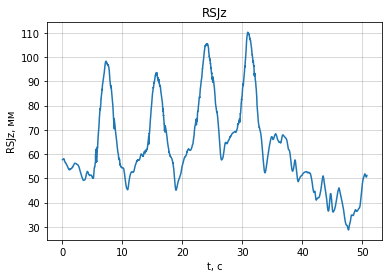

In [53]:
#Здесь можно отобразить графики координат всех маркеров без сглаживания
for i in cols:
    fig, ax = plt.subplots()
    ax.grid(color='#000000', alpha=0.15, linestyle='-', linewidth=1, which='major')
    ax.grid(color='#000000', alpha=0.1, linestyle='-', linewidth=0.5, which='minor')
    plt.title(i)
    ax.set_xlabel('t, с')
    ax.set_ylabel(i + ', мм')
    ax.plot(df['Time'], df[i])
    plt.show()

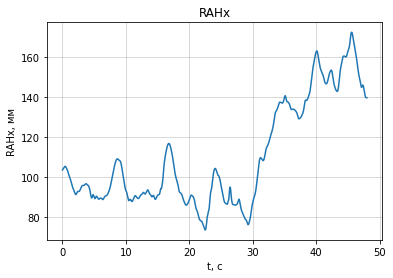

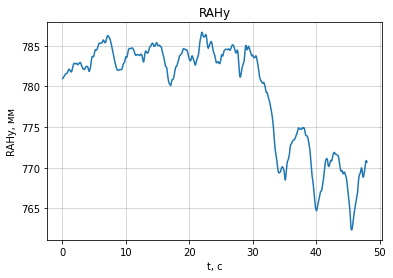

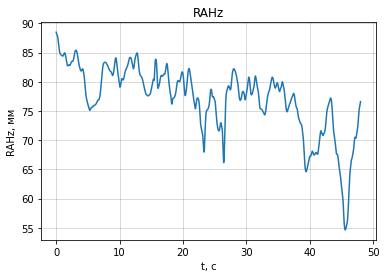

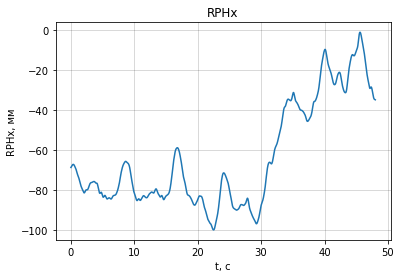

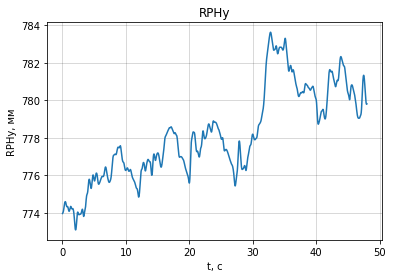

...

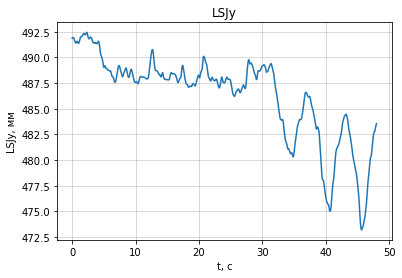

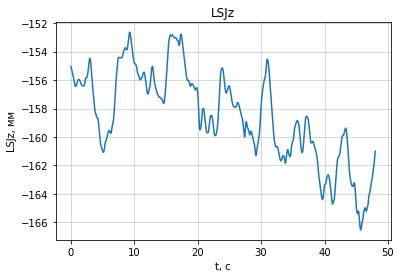

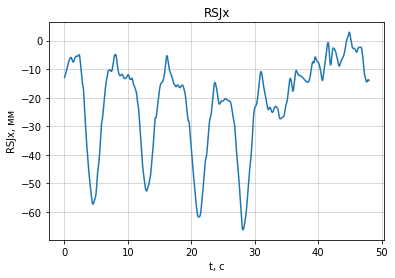

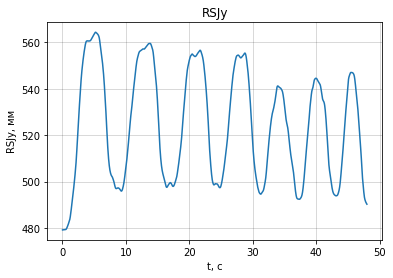

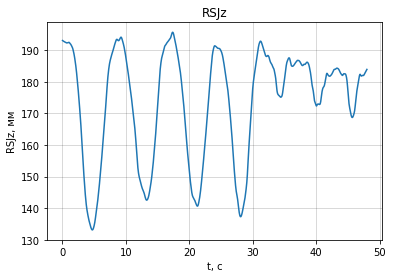

In [46]:
#Здесь можно отобразить графики координат всех маркеров со сглаживанием
for i in cols:
    fig, ax = plt.subplots()
    ax.grid(color='#000000', alpha=0.15, linestyle='-', linewidth=1, which='major')
    ax.grid(color='#000000', alpha=0.1, linestyle='-', linewidth=0.5, which='minor')
    plt.title(i)
    ax.set_xlabel('t, с')
    ax.set_ylabel(i + ', мм')
    ax.plot(df2['Time'], df2[i])
    plt.show()

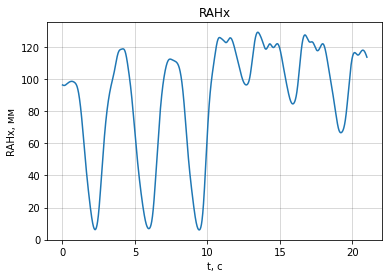

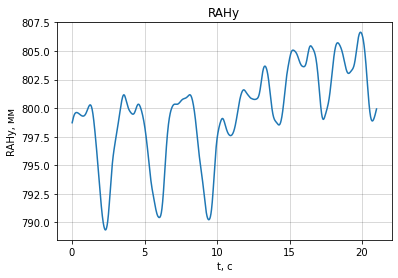

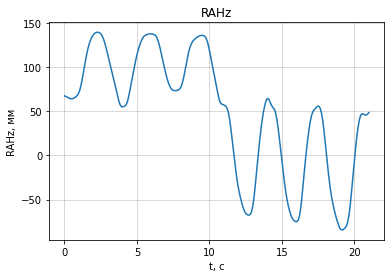

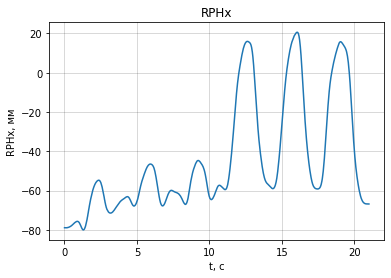

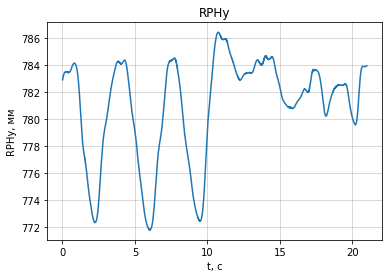

...

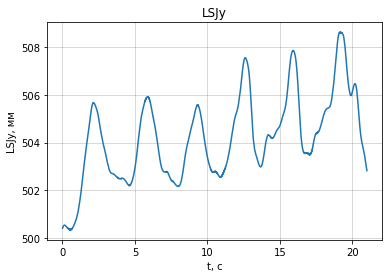

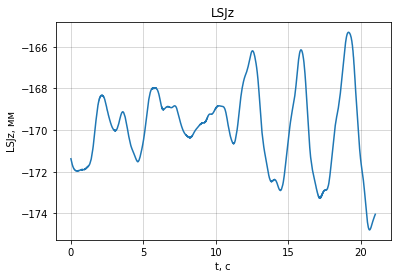

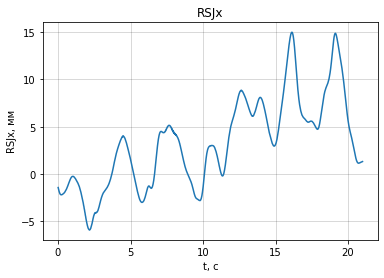

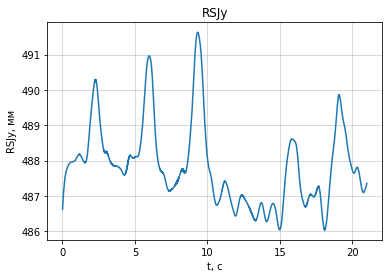

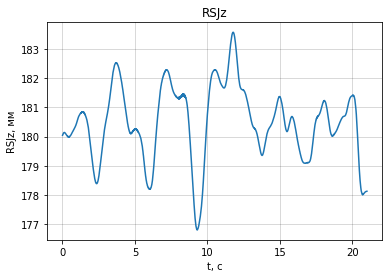

In [15]:
#100
for i in cols:
    fig, ax = plt.subplots()
    ax.grid(color='#000000', alpha=0.15, linestyle='-', linewidth=1, which='major')
    ax.grid(color='#000000', alpha=0.1, linestyle='-', linewidth=0.5, which='minor')
    plt.title(i)
    ax.set_xlabel('t, с')
    ax.set_ylabel(i + ', мм')
    ax.plot(df2['Time'], df2[i])
    plt.show()

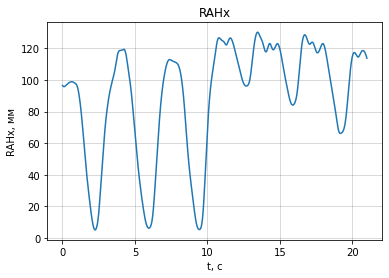

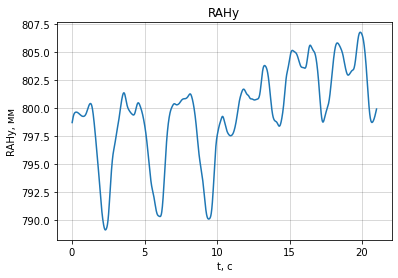

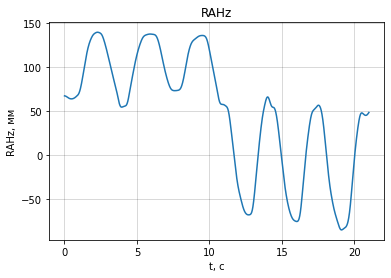

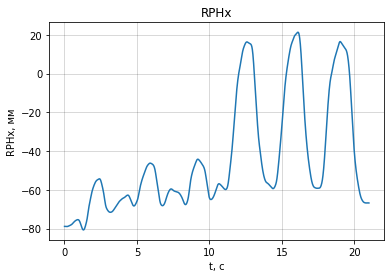

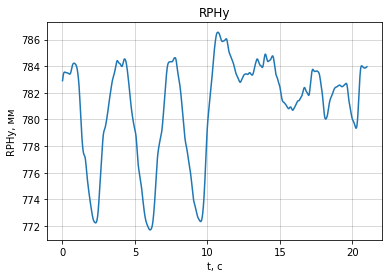

...

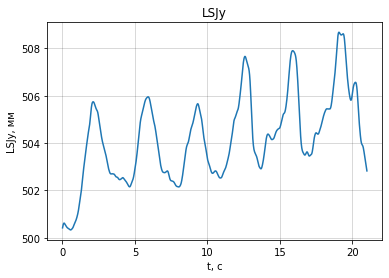

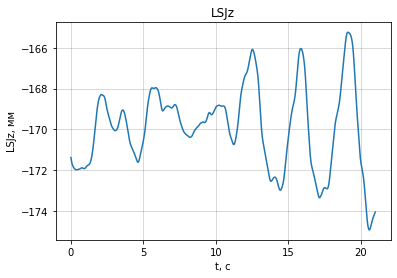

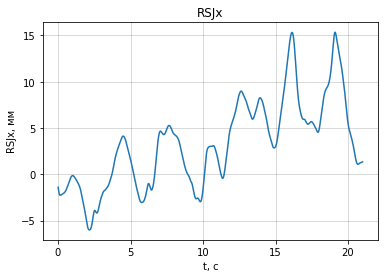

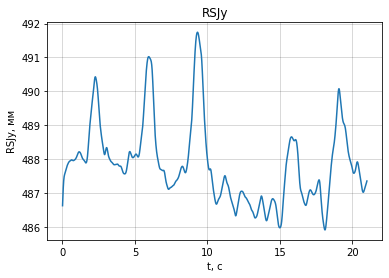

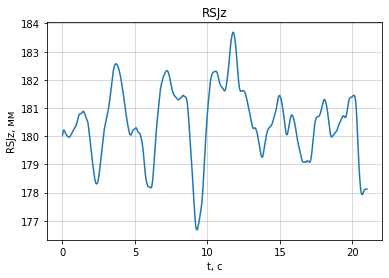

In [18]:
for i in cols:
    fig, ax = plt.subplots()
    ax.grid(color='#000000', alpha=0.15, linestyle='-', linewidth=1, which='major')
    ax.grid(color='#000000', alpha=0.1, linestyle='-', linewidth=0.5, which='minor')
    plt.title(i)
    ax.set_xlabel('t, с')
    ax.set_ylabel(i + ', мм')
    ax.plot(df2['Time'], df2[i])
    plt.show()

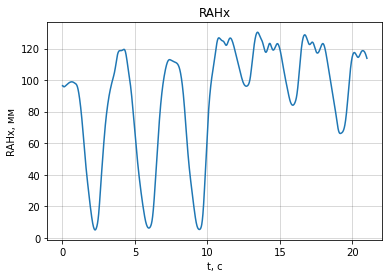

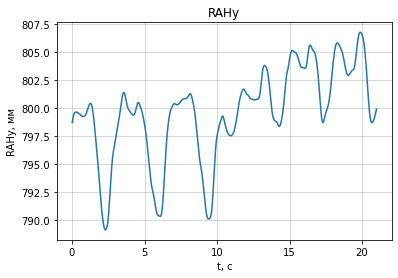

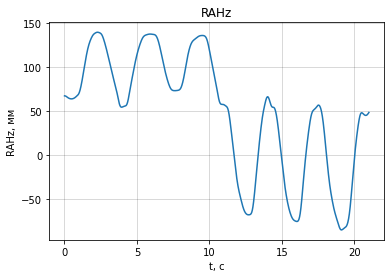

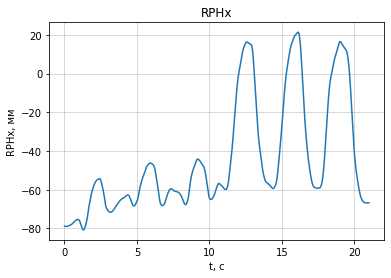

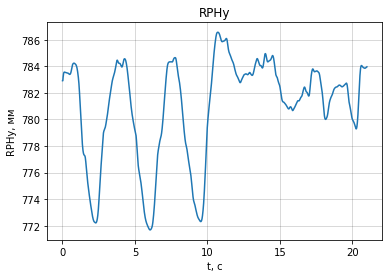

...

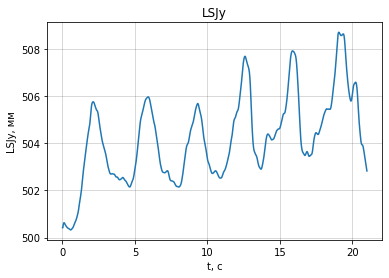

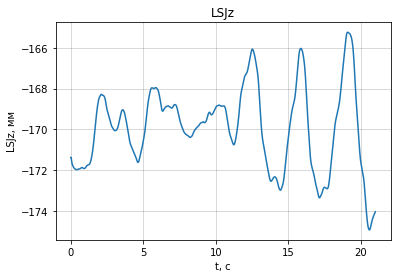

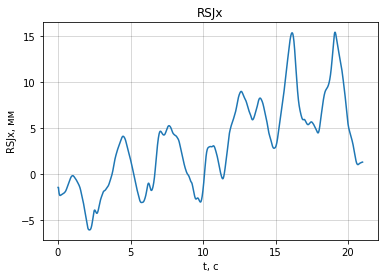

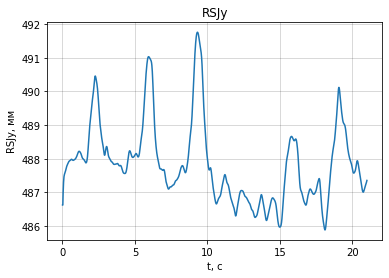

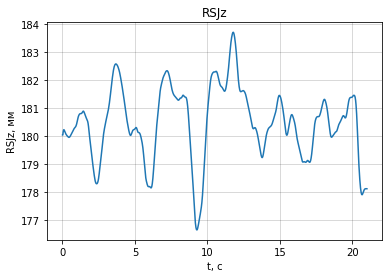

In [26]:
#5 new
for i in cols:
    fig, ax = plt.subplots()
    ax.grid(color='#000000', alpha=0.15, linestyle='-', linewidth=1, which='major')
    ax.grid(color='#000000', alpha=0.1, linestyle='-', linewidth=0.5, which='minor')
    plt.title(i)
    ax.set_xlabel('t, с')
    ax.set_ylabel(i + ', мм')
    ax.plot(df2['Time'], df2[i])
    plt.show()